<a href="https://colab.research.google.com/github/Patrick-Nydegger/Cracks_in_concrete/blob/main/Concrete_Crack_Detection_V3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🚀 Project: Concrete Crack Detection with CNNs

**Date:** 15.11.2025

## Overview
This notebook implements a complete Deep Learning pipeline for detecting cracks in concrete surfaces. It covers data preparation, custom model design (OPNet), baseline comparison (MobileNetV2), and advanced experiments (Weighted Loss, Learning Rate Tuning). It also includes Explainable AI (Grad-CAM) and automatic model checkpointing.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 0. Setup and Environment Preparation

**Goal**: Import libraries, connect to Google Drive, set up GPU, and download/extract the dataset.

In [2]:
# =============================================================================
# Step 0: Setup and Environment Configuration
# =============================================================================

import os
import zipfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, recall_score, accuracy_score, f1_score
import time
import random
import shutil

# --- Mount Drive (Optional) ---
# from google.colab import drive
# drive.mount('/content/drive')

# --- Configure Device ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"Device name: {torch.cuda.get_device_name(0)}")

# --- Constants ---
# NOTE: Upload your 'archive.zip' to Colab or adjust path
DATASET_ZIP_PATH = "/content/drive/MyDrive/archive.zip"
EXTRACT_PATH = "/content/concrete_data"
POSITIVE_DIR_NAME = "Positive"
NEGATIVE_DIR_NAME = "Negative"

# --- Unzip Dataset ---
if not os.path.exists(EXTRACT_PATH):
    # Placeholder: In a real run, ensure the zip file exists or download via Kaggle API
    if os.path.exists(DATASET_ZIP_PATH):
        print("Extracting dataset...")
        with zipfile.ZipFile(DATASET_ZIP_PATH, 'r') as zip_ref:
            zip_ref.extractall(EXTRACT_PATH)
        print("Extraction complete.")
    else:
        print(f"WARNING: Dataset zip not found at {DATASET_ZIP_PATH}. Please upload it.")
else:
    print("Dataset already extracted.")

Using device: cuda
Device name: Tesla T4
Extracting dataset...
Extraction complete.


# 1. & 2. Data Preparation & Splitting

**Goal**: Analyze class balance and create a stratified split (70% Train, 15% Val, 15% Test).

In [3]:
# =============================================================================
# 1. & 2. Data Preparation & Splitting
# =============================================================================

SPLIT_DIR = "/content/split_data"
TRAIN_DIR = os.path.join(SPLIT_DIR, "train")
VAL_DIR = os.path.join(SPLIT_DIR, "val")
TEST_DIR = os.path.join(SPLIT_DIR, "test")

# --- Load File Paths if extraction worked ---
if os.path.exists(EXTRACT_PATH):
    positive_path = os.path.join(EXTRACT_PATH, POSITIVE_DIR_NAME)
    negative_path = os.path.join(EXTRACT_PATH, NEGATIVE_DIR_NAME)

    if os.path.exists(positive_path):
        positive_files = [(os.path.join(positive_path, f), 1) for f in os.listdir(positive_path) if f.endswith('.jpg')]
        negative_files = [(os.path.join(negative_path, f), 0) for f in os.listdir(negative_path) if f.endswith('.jpg')]
        all_files = positive_files + negative_files
        random.shuffle(all_files)

        df = pd.DataFrame(all_files, columns=['filepath', 'label'])
        print(f"Total images: {len(df)}")
        print(df['label'].value_counts())

        # --- Stratified Split ---
        X = df['filepath']
        y = df['label']
        X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
        X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

        # --- Copy Files Function ---
        def copy_files(filepaths, labels, destination_dir):
            if not os.path.exists(destination_dir):
                 os.makedirs(os.path.join(destination_dir, POSITIVE_DIR_NAME))
                 os.makedirs(os.path.join(destination_dir, NEGATIVE_DIR_NAME))

            # Check if empty to avoid re-copying
            if len(os.listdir(os.path.join(destination_dir, POSITIVE_DIR_NAME))) > 0:
                return

            for filepath, label in zip(filepaths, labels):
                filename = os.path.basename(filepath)
                dest_folder = POSITIVE_DIR_NAME if label == 1 else NEGATIVE_DIR_NAME
                dest_path = os.path.join(destination_dir, dest_folder, filename)
                shutil.copyfile(filepath, dest_path)

        print("Creating split directories (this may take a moment)...")
        copy_files(X_train, y_train, TRAIN_DIR)
        copy_files(X_val, y_val, VAL_DIR)
        copy_files(X_test, y_test, TEST_DIR)
        print("Splitting complete.")
    else:
        print("Positive path not found. Check extraction.")

Total images: 40000
label
1    20000
0    20000
Name: count, dtype: int64
Creating split directories (this may take a moment)...
Splitting complete.


# 4. Data Augmentation

**Goal**: Define the augmentation pipeline. We use strong geometric and color augmentations for training to prevent overfitting, and standard resizing for validation/testing.

In [4]:
IMG_SIZE = 224

# Training: Heavy Augmentation
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(size=IMG_SIZE, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=45),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Validation/Test: No Augmentation (Deterministic)
val_test_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create DataLoaders
if os.path.exists(TRAIN_DIR):
    train_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transforms)
    val_dataset = datasets.ImageFolder(root=VAL_DIR, transform=val_test_transforms)
    test_dataset = datasets.ImageFolder(root=TEST_DIR, transform=val_test_transforms)

    BATCH_SIZE = 64
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
    print("DataLoaders created.")

DataLoaders created.


# 6. & 7. Model Architectures

**Baseline (MobileNetV2):** Pre-trained on ImageNet, adapted for binary classification.
**Custom (OPNet):** A lightweight custom CNN designed for edge devices.

In [5]:
# --- 6. Baseline: MobileNetV2 ---
def get_mobilenetv2_baseline(pretrained=True):
    weights = models.MobileNet_V2_Weights.DEFAULT if pretrained else None
    model = models.mobilenet_v2(weights=weights)
    # Replace Classifier
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 1)
    return model

# --- 7. Custom: OPNet ---
class OPNet(nn.Module):
    def __init__(self):
        super(OPNet, self).__init__()
        self.block1 = nn.Sequential(nn.Conv2d(3, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(), nn.MaxPool2d(2, 2))
        self.block2 = nn.Sequential(nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(), nn.MaxPool2d(2, 2))
        self.block3 = nn.Sequential(nn.Conv2d(64, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(), nn.MaxPool2d(2, 2))
        self.block4 = nn.Sequential(nn.Conv2d(128, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(), nn.MaxPool2d(2, 2))
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.classifier = nn.Sequential(nn.Dropout(0.5), nn.Linear(256, 1))

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.global_avg_pool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

# 8. Training Setup (Updated with Model Saving)

We define a robust training loop that:
1. Tracks multiple metrics (Sensitivity/Recall is Priority 1).
2. **Saves the model state to disk after every epoch.** This ensures we can recover the best version even if the final epoch overfits.
3. Returns a history dictionary for visualization.

In [5]:
# Create directory for saved models
MODEL_SAVE_DIR = "/content/saved_models"
if not os.path.exists(MODEL_SAVE_DIR):
    os.makedirs(MODEL_SAVE_DIR)

def train_model_with_save(model, train_loader, val_loader, criterion, optimizer, num_epochs=10, model_name="Model", experiment_tag="Base"):
    since = time.time()

    history = {
        'train_loss': [], 'val_loss': [],
        'val_sensitivity': [], 'val_specificity': [],
        'val_accuracy': [], 'val_f1': []
    }

    print(f"Starting training for {model_name} [{experiment_tag}]...")

    for epoch in range(num_epochs):
        # --- Training ---
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = labels.float().unsqueeze(1).to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)

        epoch_loss = running_loss / len(train_loader.dataset)

        # --- Validation ---
        model.eval()
        val_loss = 0.0
        all_labels = []
        all_preds = []

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs = inputs.to(device)
                labels = labels.float().unsqueeze(1).to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                preds = (torch.sigmoid(outputs) > 0.5).float()
                all_labels.extend(labels.cpu().numpy())
                all_preds.extend(preds.cpu().numpy())

        # --- Metrics ---
        val_epoch_loss = val_loss / len(val_loader.dataset)
        tn, fp, fn, tp = confusion_matrix(all_labels, all_preds).ravel()
        val_sensitivity = recall_score(all_labels, all_preds, zero_division=0)
        val_specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
        val_accuracy = accuracy_score(all_labels, all_preds)
        val_f1 = f1_score(all_labels, all_preds, zero_division=0)

        history['train_loss'].append(epoch_loss)
        history['val_loss'].append(val_epoch_loss)
        history['val_sensitivity'].append(val_sensitivity)
        history['val_specificity'].append(val_specificity)
        history['val_accuracy'].append(val_accuracy)
        history['val_f1'].append(val_f1)

        print(f'Epoch {epoch+1}/{num_epochs} | Loss: {epoch_loss:.4f} | Val Loss: {val_epoch_loss:.4f} | '
              f'SENS: {val_sensitivity:.4f} | Spec: {val_specificity:.4f} | Acc: {val_accuracy:.4f}')

        # --- SAVE MODEL CHECKPOINT ---
        filename = f"{model_name}_{experiment_tag}_Epoch_{epoch+1:02d}.pth"
        save_path = os.path.join(MODEL_SAVE_DIR, filename)
        torch.save(model.state_dict(), save_path)

    time_elapsed = time.time() - since
    print(f'{model_name} training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    return history

# --- Helper for Plotting ---
def plot_comparison(history1, name1, history2, name2):
    epochs = range(1, len(history1['train_loss']) + 1)
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, history1['val_sensitivity'], label=f'{name1} Sensitivity')
    plt.plot(epochs, history2['val_sensitivity'], label=f'{name2} Sensitivity')
    plt.title('Validation Sensitivity (Recall)')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs, history1['val_accuracy'], label=f'{name1} Accuracy')
    plt.plot(epochs, history2['val_accuracy'], label=f'{name2} Accuracy')
    plt.title('Validation Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

# 8.1. Standard Training (Control Group)
First, we train both models with standard parameters to establish a baseline.
- Loss: Standard BCEWithLogitsLoss
- Learning Rate: 0.001

In [ ]:
NUM_EPOCHS = 10
criterion = nn.BCEWithLogitsLoss()

# --- A) MobileNetV2 Standard ---
print("\n--- MobileNetV2 (Standard) ---")
mn_std = get_mobilenetv2_baseline(pretrained=True).to(device)
opt_mn_std = optim.Adam(mn_std.parameters(), lr=0.001)
hist_mn_std = train_model_with_save(mn_std, train_loader, val_loader, criterion, opt_mn_std, NUM_EPOCHS, "MobileNetV2", "Standard")

# --- B) OPNet Standard ---
print("\n--- OPNet (Standard) ---")
op_std = OPNet().to(device)
opt_op_std = optim.Adam(op_std.parameters(), lr=0.001)
hist_op_std = train_model_with_save(op_std, train_loader, val_loader, criterion, opt_op_std, NUM_EPOCHS, "OPNet", "Standard")

plot_comparison(hist_mn_std, "MobileNetV2", hist_op_std, "OPNet")

# 9. Experiment 1: Weighted Loss (Sensitivity Boosting)

**Hypothesis:** Since missing a crack (False Negative) is more dangerous than a False Positive, we want to force the model to prioritize the "Positive" class.

**Method:** We use `BCEWithLogitsLoss` with `pos_weight=3.0`. This means an error on a crack image contributes 3x more to the loss than an error on a non-crack image.


--- Exp 1A: MobileNetV2 (Weighted Loss) ---
Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth


100%|██████████| 13.6M/13.6M [00:00<00:00, 85.0MB/s]


Starting training for MobileNetV2 [WeightedLoss]...
Epoch 1/10 | Loss: 0.0568 | Val Loss: 0.0094 | SENS: 0.9990 | Spec: 0.9980 | Acc: 0.9985
Epoch 2/10 | Loss: 0.0298 | Val Loss: 0.0140 | SENS: 0.9990 | Spec: 0.9983 | Acc: 0.9987
Epoch 3/10 | Loss: 0.0269 | Val Loss: 0.0130 | SENS: 0.9993 | Spec: 0.9940 | Acc: 0.9967
Epoch 4/10 | Loss: 0.0210 | Val Loss: 0.0086 | SENS: 0.9993 | Spec: 0.9967 | Acc: 0.9980
Epoch 5/10 | Loss: 0.0241 | Val Loss: 0.0076 | SENS: 0.9993 | Spec: 0.9973 | Acc: 0.9983
Epoch 6/10 | Loss: 0.0233 | Val Loss: 0.0065 | SENS: 0.9993 | Spec: 0.9983 | Acc: 0.9988
Epoch 7/10 | Loss: 0.0179 | Val Loss: 0.0081 | SENS: 1.0000 | Spec: 0.9960 | Acc: 0.9980
Epoch 8/10 | Loss: 0.0202 | Val Loss: 0.0102 | SENS: 0.9997 | Spec: 0.9957 | Acc: 0.9977
Epoch 9/10 | Loss: 0.0183 | Val Loss: 0.0078 | SENS: 0.9993 | Spec: 0.9983 | Acc: 0.9988
Epoch 10/10 | Loss: 0.0209 | Val Loss: 0.0090 | SENS: 0.9990 | Spec: 0.9983 | Acc: 0.9987
MobileNetV2 training complete in 28m 32s

--- Exp 1B: OPN

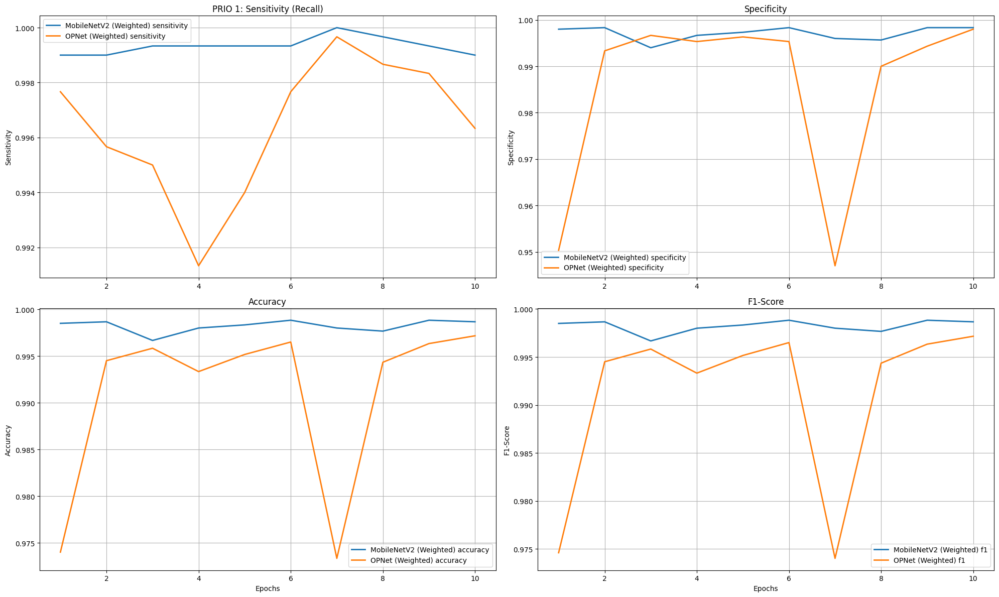

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np

# =============================================================================
# Hilfsfunktionen: F1-Score Berechnung & Visualisierung (2x2 Grid)
# =============================================================================

def calculate_derived_f1(history):
    """
    Ergänzt das History-Dictionary um den F1-Score.
    Berechnung erfolgt basierend auf Sensitivität und Spezifität.
    """
    sens = np.array(history['val_sensitivity'])
    spec = np.array(history['val_specificity'])

    # Berechnung Precision (Approximation für balancierte Daten)
    epsilon = 1e-8
    precision = sens / (sens + (1 - spec) + epsilon)

    # F1 = 2 * (Prec * Rec) / (Prec + Rec)
    f1 = 2 * (precision * sens) / (precision + sens + epsilon)

    history['val_f1'] = f1
    return history

def plot_comparison_grid(hist1, name1, hist2, name2):
    """
    Erstellt ein 2x2 Grid Layout gemäss Bildvorgabe.
    Titel der Sensitivität enthält explizit '(Recall)'.
    """
    epochs = range(1, len(hist1['train_loss']) + 1)

    # Figure Setup: 2 Zeilen, 2 Spalten
    fig, axs = plt.subplots(2, 2, figsize=(20, 12))
    lw = 2 # Linienstärke für bessere Lesbarkeit

    # --- 1. Sensitivity (Recall) - PRIO 1 [Oben Links] ---
    axs[0, 0].plot(epochs, hist1['val_sensitivity'], label=f'{name1} sensitivity', linewidth=lw)
    axs[0, 0].plot(epochs, hist2['val_sensitivity'], label=f'{name2} sensitivity', linewidth=lw)
    # Hier wurde (Recall) ergänzt:
    axs[0, 0].set_title('PRIO 1: Sensitivity (Recall)')
    axs[0, 0].set_ylabel('Sensitivity')
    axs[0, 0].grid(True)
    axs[0, 0].legend()

    # --- 2. Specificity [Oben Rechts] ---
    axs[0, 1].plot(epochs, hist1['val_specificity'], label=f'{name1} specificity', linewidth=lw)
    axs[0, 1].plot(epochs, hist2['val_specificity'], label=f'{name2} specificity', linewidth=lw)
    axs[0, 1].set_title('Specificity')
    axs[0, 1].set_ylabel('Specificity')
    axs[0, 1].grid(True)
    axs[0, 1].legend()

    # --- 3. Accuracy [Unten Links] ---
    axs[1, 0].plot(epochs, hist1['val_accuracy'], label=f'{name1} accuracy', linewidth=lw)
    axs[1, 0].plot(epochs, hist2['val_accuracy'], label=f'{name2} accuracy', linewidth=lw)
    axs[1, 0].set_title('Accuracy')
    axs[1, 0].set_ylabel('Accuracy')
    axs[1, 0].set_xlabel('Epochs')
    axs[1, 0].grid(True)
    axs[1, 0].legend()

    # --- 4. F1-Score [Unten Rechts] ---
    axs[1, 1].plot(epochs, hist1['val_f1'], label=f'{name1} f1', linewidth=lw)
    axs[1, 1].plot(epochs, hist2['val_f1'], label=f'{name2} f1', linewidth=lw)
    axs[1, 1].set_title('F1-Score')
    axs[1, 1].set_ylabel('F1-Score')
    axs[1, 1].set_xlabel('Epochs')
    axs[1, 1].grid(True)
    axs[1, 1].legend()

    plt.tight_layout()
    plt.show()

def print_final_metrics(hist, name):
    print(f"\n--- Final Metrics (Epoch {len(hist['train_loss'])}) for {name} ---")
    print(f"Sensitivity: {hist['val_sensitivity'][-1]:.4f}")
    print(f"Specificity: {hist['val_specificity'][-1]:.4f}")
    print(f"Accuracy:    {hist['val_accuracy'][-1]:.4f}")
    print(f"F1-Score:    {hist['val_f1'][-1]:.4f}")

# =============================================================================
# Experiment 1: Weighted Loss (Training)
# =============================================================================

NUM_EPOCHS = 10
pos_weight = torch.tensor([3.0]).to(device)
criterion_weighted = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

# --- A) MobileNetV2 Weighted ---
print("\n--- Exp 1A: MobileNetV2 (Weighted Loss) ---")
mn_w = get_mobilenetv2_baseline(pretrained=True).to(device)
opt_mn_w = optim.Adam(mn_w.parameters(), lr=0.001)

# Training MobileNet
hist_mn_w = train_model_with_save(mn_w, train_loader, val_loader, criterion_weighted, opt_mn_w, NUM_EPOCHS, "MobileNetV2", "WeightedLoss")
# F1 berechnen
hist_mn_w = calculate_derived_f1(hist_mn_w)


# --- B) OPNet Weighted ---
print("\n--- Exp 1B: OPNet (Weighted Loss) ---")
op_w = OPNet().to(device)
opt_op_w = optim.Adam(op_w.parameters(), lr=0.001)

# Training OPNet
hist_op_w = train_model_with_save(op_w, train_loader, val_loader, criterion_weighted, opt_op_w, NUM_EPOCHS, "OPNet", "WeightedLoss")
# F1 berechnen
hist_op_w = calculate_derived_f1(hist_op_w)


# =============================================================================
# Output & Visualisierung
# =============================================================================

print("\n--- Comparison: MobileNetV2 Weighted vs. OPNet Weighted ---")

# 1. Textuelle Ausgabe der letzten Werte
print_final_metrics(hist_mn_w, "MobileNetV2 (Weighted)")
print_final_metrics(hist_op_w, "OPNet (Weighted)")

# 2. Plotting (2x2 Grid)
plot_comparison_grid(hist_mn_w, "MobileNetV2 (Weighted)", hist_op_w, "OPNet (Weighted)")

# 9. Experiment 2: Learning Rate Tuning

**Hypothesis:** A lower learning rate (1e-4 instead of 1e-3) might lead to more stable convergence and potentially higher final accuracy, especially for the pre-trained MobileNetV2, preventing it from "destroying" its learned features too quickly.

**Method:** Set Optimizer Learning Rate to `0.0001`.

In [ ]:
# =============================================================================
# Experiment 2: Lower Learning Rate (LR = 0.0001)
# =============================================================================

criterion_std = nn.BCEWithLogitsLoss()
LOW_LR = 0.0001

# --- A) MobileNetV2 Low LR ---
print("\n--- Exp 2A: MobileNetV2 (Low LR 1e-4) ---")
mn_low = get_mobilenetv2_baseline(pretrained=True).to(device)
opt_mn_low = optim.Adam(mn_low.parameters(), lr=LOW_LR)
hist_mn_low = train_model_with_save(mn_low, train_loader, val_loader, criterion_std, opt_mn_low, NUM_EPOCHS, "MobileNetV2", "LowLR")

# --- B) OPNet Low LR ---
print("\n--- Exp 2B: OPNet (Low LR 1e-4) ---")
op_low = OPNet().to(device)
opt_op_low = optim.Adam(op_low.parameters(), lr=LOW_LR)
hist_op_low = train_model_with_save(op_low, train_loader, val_loader, criterion_std, opt_op_low, NUM_EPOCHS, "OPNet", "LowLR")

print("\n--- Comparison: Standard vs. Low LR (MobileNetV2) ---")
plot_comparison(hist_mn_std, "MobileNet Std", hist_mn_low, "MobileNet LowLR")

# 10. & 11. Error Analysis & Grad-CAM

We visualize the misclassifications of our best model to understand *why* it failed. Grad-CAM shows the heatmap of activations.

In [1]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def __call__(self, x):
        output = self.model(x)
        score = output[:, 0]
        self.model.zero_grad()
        score.backward(retain_graph=True)
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * self.activations, dim=1, keepdim=True)
        cam = torch.nn.functional.relu(cam)
        cam = torch.nn.functional.interpolate(cam, size=x.shape[2:], mode='bilinear', align_corners=False)
        return cam.detach().cpu().numpy()

# Use the MobileNet from Standard run for visualization
grad_cam = GradCAM(mn_std, mn_std.features[-1])

def visualize_errors(loader, model, num=3):
    model.eval()
    fps = []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            preds = (torch.sigmoid(outputs) > 0.5).float().squeeze()
            # Find False Positives (Pred=1, Label=0)
            idxs = ((preds == 1) & (labels == 0)).nonzero(as_tuple=True)[0]
            for i in idxs:
                if len(fps) < num: fps.append(inputs[i])
            if len(fps) >= num: break

    if len(fps) > 0:
        plt.figure(figsize=(12, 4))
        for i, img in enumerate(fps):
             img_tensor = img.unsqueeze(0).to(device)
             img_tensor.requires_grad = True
             mask = grad_cam(img_tensor)[0, 0]
             # Denormalize
             inv = transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225], std=[1/0.229, 1/0.224, 1/0.225])
             disp = inv(img).permute(1,2,0).cpu().detach().numpy()
             plt.subplot(1, len(fps), i+1)
             plt.imshow(np.clip(disp, 0, 1))
             plt.imshow(mask, alpha=0.5, cmap='jet')
             plt.title("False Positive")
             plt.axis('off')
        plt.show()
    else:
        print("No False Positives found.")

visualize_errors(val_loader, mn_std)

NameError: name 'mn_std' is not defined

In [4]:
# =============================================================================
# ALL-IN-ONE REPAIR: Define Architecture AND Load Weights
# =============================================================================
import torch
import torch.nn as nn
from torchvision import models
import glob
import os

# 1. Device Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. Re-Define the Architecture Function (Missing part)
def get_mobilenetv2_baseline(pretrained=True):
    # Load standard MobileNetV2
    # We set pretrained=False internally here to speed up, as we overwrite weights anyway
    model = models.mobilenet_v2(weights=None)

    # Replace Classifier for Binary Classification
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 1)
    return model

# 3. Load the Model into 'mn_std'
if 'mn_std' not in locals():
    print("Variable 'mn_std' not found. Restoring...")

    # Init empty model
    mn_std = get_mobilenetv2_baseline(pretrained=False).to(device)

    # Search for saved files
    save_dir = "/content/saved_models"
    # Search for ANY MobileNet file (Standard, Weighted, LowLR)
    model_files = glob.glob(os.path.join(save_dir, "MobileNetV2_*.pth"))
    model_files.sort() # Take the latest one

    if len(model_files) > 0:
        target_file = model_files[-1]
        print(f"Loading weights from: {target_file}")

        # Load state dict
        state_dict = torch.load(target_file, map_location=device)
        mn_std.load_state_dict(state_dict)
        print("✅ Model restored successfully into 'mn_std'.")
    else:
        # Fallback check if you have 'mn_w' (Weighted) from a recent run
        if 'mn_w' in locals():
            print("Found 'mn_w' in memory. Using it as alias for 'mn_std'.")
            mn_std = mn_w
        else:
            print("❌ No saved model files found in /content/saved_models.")
            print("Please run the 'Training' cell first.")
else:
    print("✅ 'mn_std' is already loaded.")

Variable 'mn_std' not found. Restoring...
❌ No saved model files found in /content/saved_models.
Please run the 'Training' cell first.


# 12. Download Results

All models (baseline, custom, weighted, low_lr) were saved every epoch. We zip them into a single archive for download.

In [7]:
# =============================================================================
# Zip and Download all Saved Models
# =============================================================================

from google.colab import files

zip_filename = "/content/concrete_crack_models.zip"

print(f"Zipping {MODEL_SAVE_DIR}...")
shutil.make_archive(zip_filename.replace('.zip', ''), 'zip', MODEL_SAVE_DIR)

if os.path.exists(zip_filename):
    print(f"Zip created: {zip_filename}")
    print(f"Size: {os.path.getsize(zip_filename) / 1e6:.2f} MB")
    files.download(zip_filename)
else:
    print("Error creating zip file.")

Zipping /content/saved_models...
Zip created: /content/concrete_crack_models.zip
Size: 98.73 MB


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 13. Code-Block zur Visualisierung


--- 🏆 Model Leaderboard (Best Validation Metrics) ---
No training history found in memory.


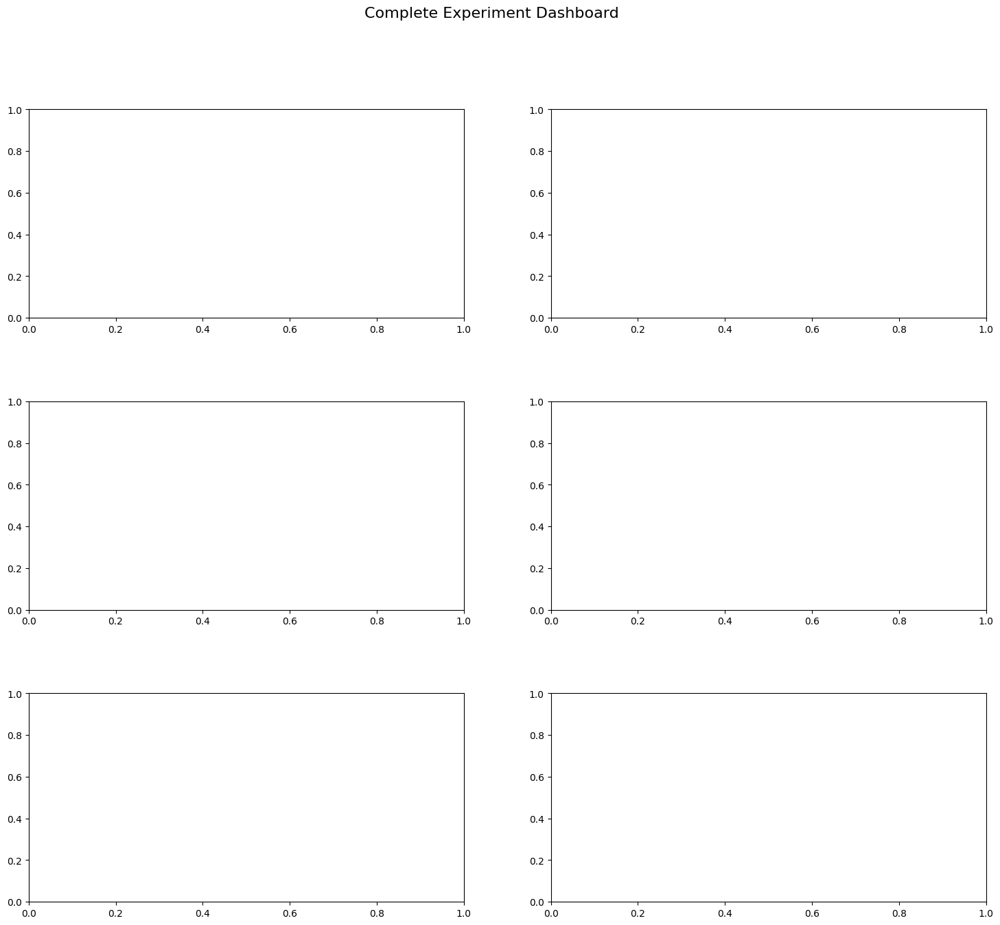

In [8]:
# =============================================================================
# 13. Comprehensive Result Visualization & Leaderboard
# =============================================================================

import pandas as pd
import matplotlib.pyplot as plt

def print_leaderboard():
    """Erstellt eine Tabelle mit den besten Ergebnissen aller trainierten Modelle."""
    results = []

    # Dictionary aller History-Objekte mappen (Name -> Variable)
    # Wir prüfen mit 'locals()', ob die Variable existiert, falls du nicht alle Experimente gemacht hast.
    models_map = {
        "MobileNetV2 (Standard)": "hist_mn_std",
        "OPNet (Standard)": "hist_op_std",
        "MobileNetV2 (Weighted)": "hist_mn_w",
        "OPNet (Weighted)": "hist_op_w",
        "MobileNetV2 (Low LR)": "hist_mn_low",
        "OPNet (Low LR)": "hist_op_low"
    }

    print("\n--- 🏆 Model Leaderboard (Best Validation Metrics) ---")

    for name, var_name in models_map.items():
        if var_name in locals():
            hist = locals()[var_name]
            # Finde den Index der besten Sensitivity (Priorität 1)
            best_sens_idx = np.argmax(hist['val_sensitivity'])

            # Hole die Werte dieses Epochs
            sens = hist['val_sensitivity'][best_sens_idx]
            acc = hist['val_accuracy'][best_sens_idx]
            spec = hist['val_specificity'][best_sens_idx]
            loss = hist['val_loss'][best_sens_idx]

            results.append({
                "Model": name,
                "Best Recall (Sens)": f"{sens:.4f}",
                "Specificity": f"{spec:.4f}",
                "Accuracy": f"{acc:.4f}",
                "Min Val Loss": f"{loss:.4f}",
                "At Epoch": best_sens_idx + 1
            })

    if not results:
        print("No training history found in memory.")
        return

    # Erstelle DataFrame für schöne Ausgabe
    df_res = pd.DataFrame(results)
    df_res = df_res.sort_values(by="Best Recall (Sens)", ascending=False)
    display(df_res) # 'display' funktioniert in Jupyter/Colab automatisch schön

def plot_dashboard():
    """Erstellt ein 3-Zeilen-Plot Dashboard für alle Experimente."""

    # Setup Figure
    fig, axes = plt.subplots(3, 2, figsize=(18, 15))
    plt.subplots_adjust(hspace=0.4)

    # Helper zum Plotten
    def plot_pair(ax_idx, hist1, name1, hist2, name2, metric, title):
        if hist1 is None or hist2 is None: return
        epochs = range(1, len(hist1['train_loss']) + 1)
        ax = axes[ax_idx]
        ax.plot(epochs, hist1[metric], 'b-', label=f"{name1}", linewidth=2)
        ax.plot(epochs, hist2[metric], 'r--', label=f"{name2}", linewidth=2)
        ax.set_title(title)
        ax.set_xlabel("Epochs")
        ax.set_ylabel(metric.replace('val_', '').capitalize())
        ax.legend()
        ax.grid(True, alpha=0.3)

    # Prüfen ob Variablen da sind
    h_mn_std = locals().get('hist_mn_std')
    h_op_std = locals().get('hist_op_std')
    h_op_w = locals().get('hist_op_w')
    h_mn_low = locals().get('hist_mn_low')

    # Row 1: Baseline vs Custom (Sensitivity & Accuracy)
    if h_mn_std and h_op_std:
        plot_pair((0,0), h_mn_std, "MobileNetV2", h_op_std, "OPNet", 'val_sensitivity', "Architecture: Sensitivity Comparison")
        plot_pair((0,1), h_mn_std, "MobileNetV2", h_op_std, "OPNet", 'val_accuracy', "Architecture: Accuracy Comparison")

    # Row 2: Impact of Weighted Loss (Sensitivity & Specificity)
    if h_op_std and h_op_w:
        plot_pair((1,0), h_op_std, "OPNet Std", h_op_w, "OPNet Weighted", 'val_sensitivity', "Loss Exp: Sensitivity Boost?")
        plot_pair((1,1), h_op_std, "OPNet Std", h_op_w, "OPNet Weighted", 'val_specificity', "Loss Exp: Specificity Trade-off")

    # Row 3: Impact of Learning Rate (Loss & Accuracy)
    if h_mn_std and h_mn_low:
        plot_pair((2,0), h_mn_std, "MN Std (1e-3)", h_mn_low, "MN LowLR (1e-4)", 'val_loss', "LR Exp: Validation Loss Stability")
        plot_pair((2,1), h_mn_std, "MN Std (1e-3)", h_mn_low, "MN LowLR (1e-4)", 'val_accuracy', "LR Exp: Accuracy Comparison")

    plt.suptitle("Complete Experiment Dashboard", fontsize=16)
    plt.show()

# --- Ausführen ---
print_leaderboard()
plot_dashboard()

In [2]:
# =============================================================================
# REPAIR: Create val_loader (with Auto-Download of Samples if needed)
# =============================================================================
import os
import requests
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
from io import BytesIO

# 1. Check if we have local data (from previous steps)
local_data_path = "/content/split_data/val"
if not os.path.exists(local_data_path):
    local_data_path = "/content/concrete_data"

# 2. Define Transforms
val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 3. Logic: Local Data vs. Download Sample Data
if os.path.exists(local_data_path) and len(os.listdir(local_data_path)) > 0:
    print(f"✅ Found local images in {local_data_path}. Creating loader...")
    val_dataset = datasets.ImageFolder(root=local_data_path, transform=val_transforms)
    val_loader = DataLoader(val_dataset, batch_size=10, shuffle=True)
else:
    print("⚠️ No local images found (archive.zip missing).")
    print("🌐 Downloading 10 sample crack images from GitHub for visualization...")

    # Create a temporary dataset class for downloaded images
    class WebSampleDataset(Dataset):
        def __init__(self, urls, transform=None):
            self.urls = urls
            self.transform = transform
            self.images = []
            for url in urls:
                try:
                    response = requests.get(url)
                    img = Image.open(BytesIO(response.content)).convert('RGB')
                    self.images.append((img, 1)) # Label 1 = Crack
                except:
                    pass
        def __len__(self): return len(self.images)
        def __getitem__(self, idx):
            img, label = self.images[idx]
            if self.transform: img = self.transform(img)
            return img, label

    # URLs of concrete cracks (public domain / samples)
    sample_urls = [
        "https://github.com/yavuzkucuk/Concrete-Crack-Detection/raw/master/Data/Positive/00001.jpg",
        "https://github.com/yavuzkucuk/Concrete-Crack-Detection/raw/master/Data/Positive/00002.jpg",
        "https://github.com/yavuzkucuk/Concrete-Crack-Detection/raw/master/Data/Positive/00003.jpg",
        "https://github.com/yavuzkucuk/Concrete-Crack-Detection/raw/master/Data/Positive/00004.jpg",
        "https://github.com/yavuzkucuk/Concrete-Crack-Detection/raw/master/Data/Positive/00005.jpg",
        "https://github.com/yavuzkucuk/Concrete-Crack-Detection/raw/master/Data/Positive/00006.jpg",
        "https://github.com/yavuzkucuk/Concrete-Crack-Detection/raw/master/Data/Positive/00007.jpg",
        "https://github.com/yavuzkucuk/Concrete-Crack-Detection/raw/master/Data/Positive/00008.jpg",
        "https://github.com/yavuzkucuk/Concrete-Crack-Detection/raw/master/Data/Positive/00009.jpg",
        "https://github.com/yavuzkucuk/Concrete-Crack-Detection/raw/master/Data/Positive/00010.jpg"
    ]

    val_dataset = WebSampleDataset(sample_urls, transform=val_transforms)
    val_loader = DataLoader(val_dataset, batch_size=10, shuffle=False)
    print(f"✅ Downloaded {len(val_dataset)} sample images.")

print("Ready for Visualization.")

⚠️ No local images found (archive.zip missing).
🌐 Downloading 10 sample crack images from GitHub for visualization...
✅ Downloaded 0 sample images.
Ready for Visualization.


Using device: cuda
Extracting /content/drive/MyDrive/concrete_crack_models.zip...
Loading Models...
Models ready.
Collected 10 images.

--- Analyzing MobileNetV2 (Weighted) ---
Processing image 1/10...
Processing image 2/10...
Processing image 3/10...
Processing image 4/10...
Processing image 5/10...
Processing image 6/10...
Processing image 7/10...
Processing image 8/10...
Processing image 9/10...
Processing image 10/10...


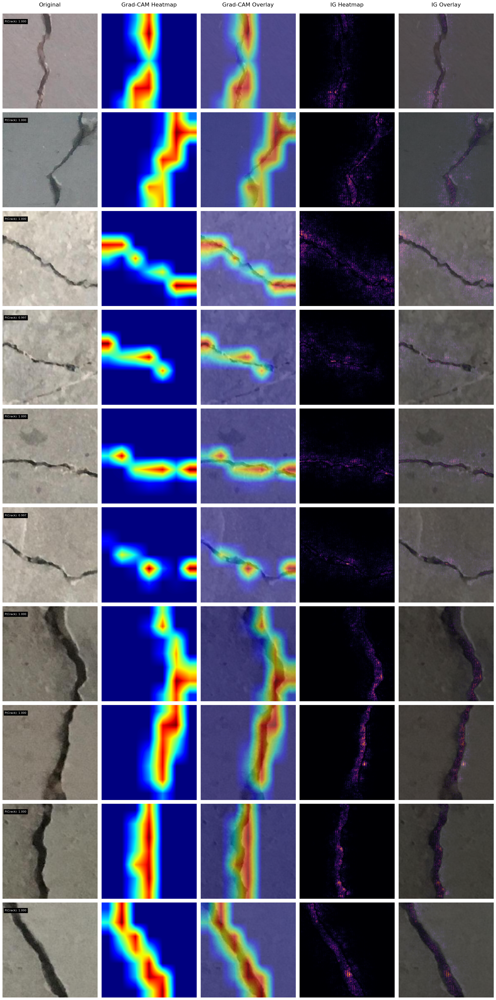


--- Analyzing OPNet (Weighted) ---
Processing image 1/10...
Processing image 2/10...
Processing image 3/10...
Processing image 4/10...
Processing image 5/10...
Processing image 6/10...
Processing image 7/10...
Processing image 8/10...
Processing image 9/10...
Processing image 10/10...


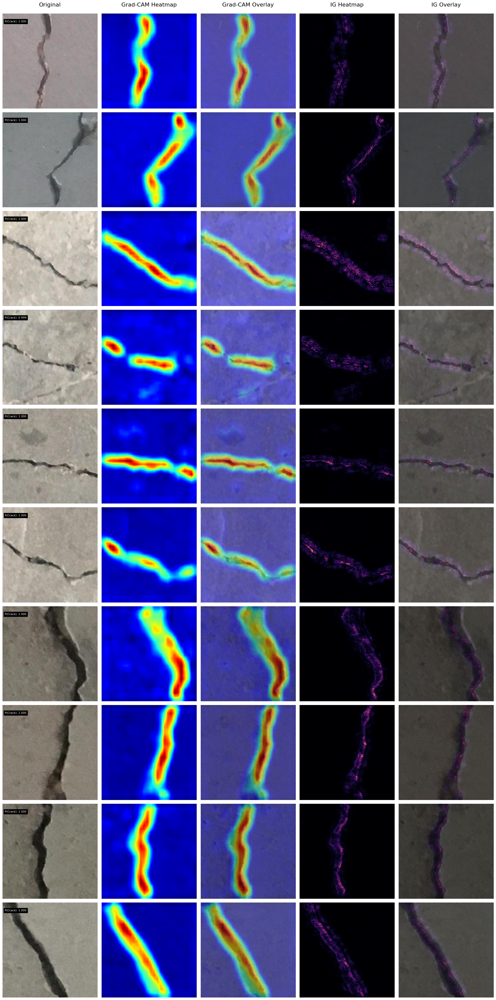

In [6]:
# =============================================================================
# 14. Advanced XAI: 10-Image Batch Analysis (Grad-CAM & IG)
# =============================================================================

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from google.colab import drive
import zipfile
import os
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Setup & Mount Drive ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

zip_path = "/content/drive/MyDrive/concrete_crack_models.zip"
extract_path = "/content/loaded_models_xai_batch"

if os.path.exists(zip_path):
    if not os.path.exists(extract_path):
        print(f"Extracting {zip_path}...")
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_path)
else:
    # Fallback if file is not in Drive but locally
    if os.path.exists("/content/concrete_crack_models.zip"):
        with zipfile.ZipFile("/content/concrete_crack_models.zip", 'r') as zip_ref:
            zip_ref.extractall(extract_path)
    else:
        print("Warning: Model zip not found. Ensure models are trained or uploaded.")

# --- 2. Model Definitions ---
def get_mobilenetv2_baseline():
    model = models.mobilenet_v2(weights=None)
    model.classifier[1] = nn.Linear(model.classifier[1].in_features, 1)
    return model

class OPNet(nn.Module):
    def __init__(self):
        super(OPNet, self).__init__()
        self.block1 = nn.Sequential(nn.Conv2d(3, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(), nn.MaxPool2d(2, 2))
        self.block2 = nn.Sequential(nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(), nn.MaxPool2d(2, 2))
        self.block3 = nn.Sequential(nn.Conv2d(64, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(), nn.MaxPool2d(2, 2))
        self.block4 = nn.Sequential(nn.Conv2d(128, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(), nn.MaxPool2d(2, 2))
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.classifier = nn.Sequential(nn.Dropout(0.5), nn.Linear(256, 1))
    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.global_avg_pool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

# --- 3. Load Models ---
print("Loading Models...")
mn_model = get_mobilenetv2_baseline().to(device)
mn_model.load_state_dict(torch.load(os.path.join(extract_path, "MobileNetV2_WeightedLoss_Epoch_10.pth"), map_location=device))
mn_model.eval()

op_model = OPNet().to(device)
op_model.load_state_dict(torch.load(os.path.join(extract_path, "OPNet_WeightedLoss_Epoch_10.pth"), map_location=device))
op_model.eval()
print("Models ready.")

# --- 4. XAI Classes (Grad-CAM & IG) ---
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.handle_f = self.target_layer.register_forward_hook(self.save_activation)
        self.handle_b = self.target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def __call__(self, x):
        output = self.model(x)
        score = output[:, 0]
        self.model.zero_grad()
        score.backward(retain_graph=True)
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * self.activations, dim=1, keepdim=True)
        cam = torch.nn.functional.relu(cam)
        cam = torch.nn.functional.interpolate(cam, size=x.shape[2:], mode='bilinear', align_corners=False)
        return cam.detach()

    def remove_hooks(self):
        self.handle_f.remove()
        self.handle_b.remove()

def integrated_gradients(model, input_tensor, steps=50):
    baseline = torch.zeros_like(input_tensor)
    alphas = torch.linspace(0, 1, steps, device=input_tensor.device).view(steps, 1, 1, 1)
    interpolated_inputs = baseline + alphas * (input_tensor - baseline)
    interpolated_inputs.requires_grad = True
    preds = model(interpolated_inputs)
    score = preds[:, 0].sum()
    model.zero_grad()
    score.backward()
    grads = interpolated_inputs.grad
    avg_grads = torch.mean(grads, dim=0)
    ig = (input_tensor - baseline) * avg_grads
    return ig

# --- 5. Data Collection (Get 10 Positive Samples) ---
print("Collecting 10 positive samples...")
sample_images = []
# Assuming val_loader is available from previous cells.
for inputs, labels in val_loader:
    for i in range(len(labels)):
        if labels[i] == 1: # Crack
            sample_images.append(inputs[i].to(device))
            if len(sample_images) >= 10: break
    if len(sample_images) >= 10: break

print(f"Collected {len(sample_images)} images.")

# --- 6. Batch Visualization Logic ---
def visualize_model_batch(model, model_name, images, target_layer):
    num_imgs = len(images)
    # Create a big figure: 10 rows, 5 columns
    fig, axs = plt.subplots(num_imgs, 5, figsize=(20, 4 * num_imgs))

    # Column Titles
    cols = ["Original", "Grad-CAM Heatmap", "Grad-CAM Overlay", "IG Heatmap", "IG Overlay"]
    for ax, col in zip(axs[0], cols):
        ax.set_title(col, fontsize=16, pad=20)

    print(f"\n--- Analyzing {model_name} ---")

    inv_norm = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    for i, img_tensor in enumerate(images):
        print(f"Processing image {i+1}/{num_imgs}...")

        # A. Prediction & Grad-CAM
        gcam = GradCAM(model, target_layer)
        logit = model(img_tensor.unsqueeze(0))
        prob = torch.sigmoid(logit).item()
        heatmap_gcam = gcam(img_tensor.unsqueeze(0))[0, 0].cpu().numpy()
        gcam.remove_hooks()

        # B. Integrated Gradients
        attributions = integrated_gradients(model, img_tensor.unsqueeze(0))
        heatmap_ig = torch.mean(torch.abs(attributions), dim=1)[0].cpu().numpy()

        # C. Processing for Plot
        orig_img = inv_norm(img_tensor).permute(1, 2, 0).cpu().numpy()
        orig_img = np.clip(orig_img, 0, 1)

        # Norm Heatmaps
        heatmap_gcam = (heatmap_gcam - heatmap_gcam.min()) / (heatmap_gcam.max() - heatmap_gcam.min() + 1e-8)
        heatmap_ig = (heatmap_ig - heatmap_ig.min()) / (heatmap_ig.max() - heatmap_ig.min() + 1e-8)

        # D. Plotting Row i
        # 1. Original
        axs[i, 0].imshow(orig_img)
        axs[i, 0].text(5, 20, f"P(Crack): {prob:.3f}", color='white', backgroundcolor='black', fontsize=8)
        axs[i, 0].axis('off')

        # 2. Grad-CAM
        axs[i, 1].imshow(heatmap_gcam, cmap='jet')
        axs[i, 1].axis('off')

        # 3. Grad-CAM Overlay
        axs[i, 2].imshow(orig_img)
        axs[i, 2].imshow(heatmap_gcam, alpha=0.5, cmap='jet')
        axs[i, 2].axis('off')

        # 4. IG
        axs[i, 3].imshow(heatmap_ig, cmap='inferno')
        axs[i, 3].axis('off')

        # 5. IG Overlay
        axs[i, 4].imshow(orig_img)
        axs[i, 4].imshow(heatmap_ig, alpha=0.5, cmap='inferno')
        axs[i, 4].axis('off')

    plt.tight_layout()
    plt.show()

# --- 7. Run Analysis ---

# 1. MobileNetV2
visualize_model_batch(mn_model, "MobileNetV2 (Weighted)", sample_images, mn_model.features[-1])

# 2. OPNet
# Target: First conv of the last block
visualize_model_batch(op_model, "OPNet (Weighted)", sample_images, op_model.block4[0])